# 03 - Demand grids and activity proxy

Discretises each zone into regular grids at 250, 500 and 1000 m, counts OpenStreetMap
activity features per cell, and combines them into the relative-demand weight `w_i`
scaled to 1-5.

**Output:** demand grids of 2,192 / 556 / 142 cells. The 500 m grid is the baseline.

In [ ]:
# If needed:
# %pip install -U pandas numpy geopandas osmnx folium plotly pyarrow shapely

from pathlib import Path
import numpy as np, pandas as pd, geopandas as gpd, osmnx as ox, folium
import plotly.express as px
from shapely.geometry import box
from branca.element import Element

PROJECT_ROOT = next(
    (candidate for candidate in [Path.cwd(), *Path.cwd().parents]
     if (candidate / "data").is_dir() and (candidate / "notebooks").is_dir()),
    None,
)
if PROJECT_ROOT is None:
    raise FileNotFoundError("Run this notebook from the repository root or its notebooks directory.")
PROCESSED_DIR=PROJECT_ROOT/"data"/"processed"
MODEL_DIR=PROJECT_ROOT/"data"/"model"
MAP_DIR=PROJECT_ROOT/"outputs"/"maps"
REPORT_DIR=PROJECT_ROOT/"outputs"/"reports"
for p in [PROCESSED_DIR,MODEL_DIR,MAP_DIR,REPORT_DIR]: p.mkdir(parents=True,exist_ok=True)
ox.settings.use_cache=True
ox.settings.requests_timeout=180
GRID_SIZES_M=[250,500,1000]

## 1. Load notebook 02 outputs

In [ ]:
zone_file=PROCESSED_DIR/"hajj_analytical_zones_v1.gpkg"
facility_files=[PROCESSED_DIR/"hajj_medical_locations_zoned_v1.gpkg",
                PROCESSED_DIR/"hajj_medical_locations_zoned_v1.parquet"]
facility_file=next((p for p in facility_files if p.exists()),None)
if not zone_file.exists() or facility_file is None:
    raise FileNotFoundError("Run notebook 02 first. Required zoned outputs were not found.")

zones=gpd.read_file(zone_file).to_crs(4326)
locations=(gpd.read_parquet(facility_file) if facility_file.suffix==".parquet"
           else gpd.read_file(facility_file)).to_crs(4326)
HAJJ_ZONES=["Haram_Makkah","Mina","Muzdalifah","Arafat"]
zones=zones[zones.zone.isin(HAJJ_ZONES)].copy()
print("Zones:",zones.zone.tolist())
print("Medical infrastructure:",len(locations))

Zones: ['Haram_Makkah', 'Mina', 'Muzdalifah', 'Arafat']
Medical infrastructure: 216


## 2. Retrieve Hajj-relevant OSM spatial features

In [ ]:
HAJJ_ACTIVITY_TAGS={
 "tourism":["camp_site","caravan_site","hotel","hostel","guest_house"],
 "amenity":["place_of_worship","bus_station","parking","shelter"],
 "highway":["pedestrian","footway","steps"],
 "public_transport":True,
 "railway":["station","halt"],
 "building":True,
}
study_union=zones.geometry.union_all()
try:
    activity=ox.features_from_polygon(study_union,tags=HAJJ_ACTIVITY_TAGS).reset_index()
    activity=gpd.GeoDataFrame(activity,geometry="geometry",crs=4326)
except Exception as e:
    print("OSM activity query failed:",e)
    activity=gpd.GeoDataFrame(columns=["geometry"],geometry="geometry",crs=4326)
print("Activity features:",len(activity))

Activity features: 10635


## 3. Classify retrieved spatial features

In [ ]:
def classify_activity(r):
    tourism=str(r.get("tourism","")).lower()
    amenity=str(r.get("amenity","")).lower()
    highway=str(r.get("highway","")).lower()
    pt=str(r.get("public_transport","")).lower()
    railway=str(r.get("railway","")).lower()
    building=str(r.get("building","")).lower()
    if tourism in {"camp_site","caravan_site"}: return "camp_accommodation"
    if tourism in {"hotel","hostel","guest_house"}: return "accommodation"
    if amenity=="place_of_worship": return "place_of_worship"
    if amenity=="bus_station" or pt not in {"","nan","none"} or railway in {"station","halt"}: return "transport"
    if highway in {"pedestrian","footway","steps"}: return "pedestrian"
    if amenity in {"parking","shelter"}: return "support_amenity"
    if building not in {"","nan","none","no"}: return "building"
    return "other"

if len(activity):
    activity["activity_class"]=activity.apply(classify_activity,axis=1)
    display(activity.activity_class.value_counts())

activity_class
building              7301
pedestrian            1029
accommodation          817
camp_accommodation     587
transport              362
place_of_worship       331
support_amenity        208
Name: count, dtype: int64

## 4. Build 250 m, 500 m, and 1000 m demand grids

In [ ]:
utm_crs=zones.estimate_utm_crs()
zones_utm=zones.to_crs(utm_crs)

def build_zone_grid(r,size):
    minx,miny,maxx,maxy=r.geometry.bounds
    rec=[]; seq=1
    for x in np.arange(minx,maxx,size):
        for y in np.arange(miny,maxy,size):
            cell=box(x,y,x+size,y+size)
            if r.geometry.contains(cell.centroid):
                rec.append({"hajj_zone":r.zone,"grid_size_m":size,"cell_seq":seq,"geometry":cell})
                seq+=1
    return rec

grids={}
for size in GRID_SIZES_M:
    rec=[]
    for _,r in zones_utm.iterrows(): rec.extend(build_zone_grid(r,size))
    g=gpd.GeoDataFrame(rec,geometry="geometry",crs=utm_crs)
    g["demand_point_id"]=[f"D_{size}_{z}_{n:04d}" for z,n in zip(g.hajj_zone,g.cell_seq)]
    g["cell_area_m2"]=g.geometry.area
    g["centroid_geometry"]=g.geometry.centroid
    cw=gpd.GeoSeries(g.centroid_geometry,crs=utm_crs).to_crs(4326)
    g["centroid_lat"],g["centroid_lon"]=cw.y.values,cw.x.values
    grids[size]=g
    print(size,"m:",len(g),"cells")

250 m: 2192 cells
500 m: 556 cells
1000 m: 142 cells


## 5. Attach OSM feature counts to each grid cell

In [ ]:
activity_utm=activity.to_crs(utm_crs) if len(activity) else activity
CLASSES=["camp_accommodation","accommodation","place_of_worship","transport",
         "pedestrian","support_amenity","building"]

def attach_counts(g):
    out=g.copy()
    for c in CLASSES: out[c+"_count"]=0
    if not len(activity_utm): return out
    j=gpd.sjoin(activity_utm[["activity_class","geometry"]],
                out[["demand_point_id","geometry"]],how="inner",predicate="intersects")
    if len(j):
        counts=j.groupby(["demand_point_id","activity_class"]).size().unstack(fill_value=0)
        for c in CLASSES:
            if c in counts: out[c+"_count"]=out.demand_point_id.map(counts[c]).fillna(0).astype(int)
    return out

for size in GRID_SIZES_M: grids[size]=attach_counts(grids[size])

## 6. Medical-accessibility covariates

In [ ]:
fac=locations.to_crs(utm_crs)
def nearest_km(points,targets):
    if not len(targets): return np.full(len(points),np.nan)
    tg=list(targets.geometry)
    return np.array([min(p.distance(t) for t in tg)/1000 for p in points])

for size,g in grids.items():
    pts=g.centroid_geometry
    g["dist_nearest_medical_km"]=nearest_km(pts,fac)
    g["dist_nearest_hospital_km"]=nearest_km(pts,fac[fac.category=="hospital"])
    g["dist_nearest_seasonal_center_km"]=nearest_km(pts,fac[fac.category=="seasonal_health_center"])
    g["dist_nearest_ambulance_km"]=nearest_km(pts,fac[fac.category=="ambulance_station"])

## 7. Exploratory OSM activity index

Raw weighted count of Hajj-relevant OSM features per grid cell. This index is a measure
of mapped spatial activity and is not a measure of medical demand.

In [ ]:
WEIGHTS={"camp_accommodation_count":4.0,"accommodation_count":2.0,
"place_of_worship_count":2.0,"transport_count":3.0,"pedestrian_count":2.0,
"support_amenity_count":1.0,"building_count":0.25}

for size,g in grids.items():
    raw=sum(g[c].to_numpy(float)*w for c,w in WEIGHTS.items())
    g["osm_activity_index_raw"]=raw
    g["exploratory_osm_activity_index"]=100*(raw-raw.min())/(raw.max()-raw.min()) if raw.max()>raw.min() else 0
display(pd.Series(WEIGHTS,name="exploratory_weight"))

camp_accommodation_count    4.00
accommodation_count         2.00
place_of_worship_count      2.00
transport_count             3.00
pedestrian_count            2.00
support_amenity_count       1.00
building_count              0.25
Name: exploratory_weight, dtype: float64

## 7B. Formal baseline proxy-demand weight

For the baseline OR model, every valid Hajj grid cell receives positive demand. Let `P_i` be the OSM activity index rescaled to 0-1. The weight is `d_i = 1 + alpha P_i`, with baseline `alpha = 4`, producing demand weights from 1 to 5. This prevents cells with no mapped OSM activity from receiving zero importance.

In [ ]:
BASELINE_PROXY_ALPHA=4.0
for size,g in grids.items():
    g["osm_activity_proxy_0_1"]=g["exploratory_osm_activity_index"]/100.0
    g["demand_weight_uniform"]=1.0
    g["proxy_demand_weight"]=1.0+BASELINE_PROXY_ALPHA*g["osm_activity_proxy_0_1"]
    grids[size]=g

print("Baseline alpha:",BASELINE_PROXY_ALPHA)
print("Proxy-demand range:",1,"to",1+BASELINE_PROXY_ALPHA)
display(grids[500][["demand_point_id","hajj_zone","exploratory_osm_activity_index",
"osm_activity_proxy_0_1","demand_weight_uniform","proxy_demand_weight"]]
.sort_values("proxy_demand_weight",ascending=False).head(15))

Baseline alpha: 4.0
Proxy-demand range: 1 to 5.0


,demand_point_id,hajj_zone,exploratory_osm_activity_index,osm_activity_proxy_0_1,demand_weight_uniform,proxy_demand_weight
111,D_500_Haram_Makkah_0112,Haram_Makkah,100.000000,1.000000,1.0,5.000000
257,D_500_Mina_0050,Mina,98.501629,0.985016,1.0,4.940065
280,D_500_Mina_0073,Mina,94.723127,0.947231,1.0,4.788925
235,D_500_Mina_0028,Mina,84.625407,0.846254,1.0,4.385016
269,D_500_Mina_0062,Mina,81.693811,0.816938,1.0,4.267752
93,D_500_Haram_Makkah_0094,Haram_Makkah,79.934853,0.799349,1.0,4.197394
281,D_500_Mina_0074,Mina,71.270358,0.712704,1.0,3.850814
95,D_500_Haram_Makkah_0096,Haram_Makkah,69.446254,0.694463,1.0,3.777850
270,D_500_Mina_0063,Mina,68.729642,0.687296,1.0,3.749186
245,D_500_Mina_0038,Mina,68.469055,0.684691,1.0,3.738762


## 8. Compare resolutions

In [ ]:
summary=[]
for size,g in grids.items():
    summary.append({"grid_size_m":size,"number_of_cells":len(g),
    "mean_nearest_medical_km":g.dist_nearest_medical_km.mean(),
    "max_nearest_medical_km":g.dist_nearest_medical_km.max(),
    "cells_with_activity_features":int((g.osm_activity_index_raw>0).sum())})
resolution_summary=pd.DataFrame(summary)
display(resolution_summary)
for size,g in grids.items():
    print("\n",size,"m by zone"); display(g.hajj_zone.value_counts())

,grid_size_m,number_of_cells,mean_nearest_medical_km,max_nearest_medical_km,cells_with_activity_features
0,250,2192,0.763707,2.786462,1120
1,500,556,0.764483,2.743518,390
2,1000,142,0.759217,2.443777,126



 250 m by zone


hajj_zone
Haram_Makkah    812
Arafat          616
Mina            448
Muzdalifah      316
Name: count, dtype: int64


 500 m by zone


hajj_zone
Haram_Makkah    208
Arafat          156
Mina            112
Muzdalifah       80
Name: count, dtype: int64


 1000 m by zone


hajj_zone
Haram_Makkah    52
Arafat          37
Mina            32
Muzdalifah      21
Name: count, dtype: int64

## 9. Plotly comparison maps

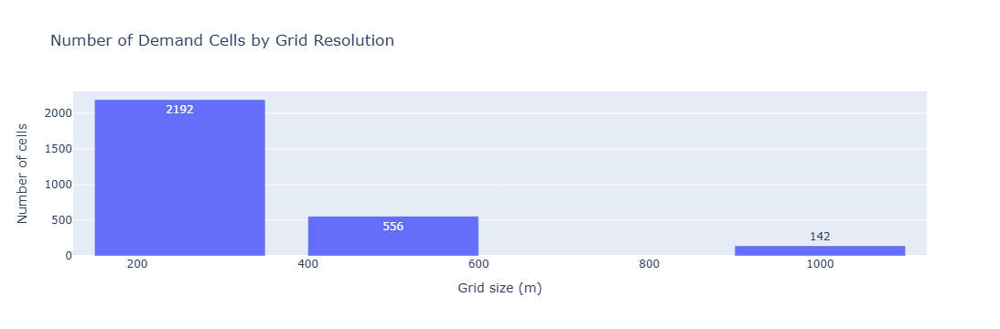

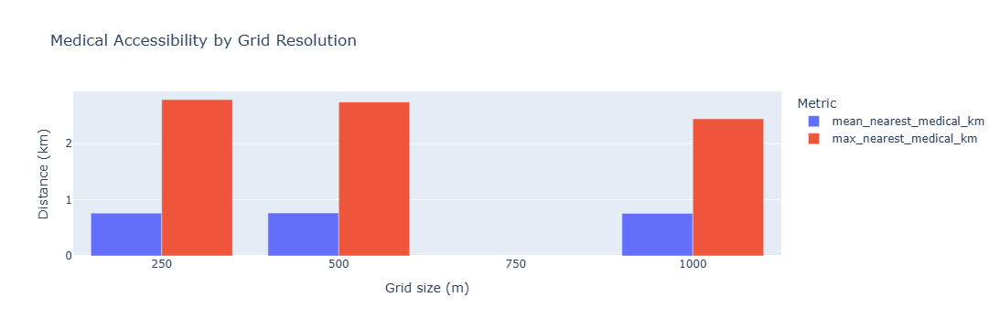

In [ ]:
# Plotly is used here for analytical comparison, not as a duplicate map.

resolution_plot = resolution_summary.copy()

fig = px.bar(
    resolution_plot,
    x="grid_size_m",
    y="number_of_cells",
    text="number_of_cells",
    title="Number of Demand Cells by Grid Resolution",
    labels={"grid_size_m":"Grid size (m)", "number_of_cells":"Number of cells"}
)
fig.show()

coverage_rows=[]
for size,g in grids.items():
    coverage_rows.append({
        "grid_size_m":size,
        "mean_nearest_medical_km":g["dist_nearest_medical_km"].mean(),
        "max_nearest_medical_km":g["dist_nearest_medical_km"].max()
    })
coverage_df=pd.DataFrame(coverage_rows)

fig=px.bar(
    coverage_df,
    x="grid_size_m",
    y=["mean_nearest_medical_km","max_nearest_medical_km"],
    barmode="group",
    title="Medical Accessibility by Grid Resolution",
    labels={"grid_size_m":"Grid size (m)","value":"Distance (km)","variable":"Metric"}
)
fig.show()

## 10. Folium map for the 500 m baseline candidate

In [ ]:
import branca.colormap as cm

ZONE_COLORS={
    "Haram_Makkah":"#1f77b4",
    "Mina":"#2ca02c",
    "Muzdalifah":"#9467bd",
    "Arafat":"#d62728"
}

for size in GRID_SIZES_M:
    g=grids[size].to_crs(4326).copy()

    m=folium.Map(
        location=[float(g.centroid_lat.mean()),float(g.centroid_lon.mean())],
        zoom_start=11,
        control_scale=True
    )

    # Continuous color scale for the exploratory OSM index.
    colormap=cm.linear.YlOrRd_09.scale(0,100)
    colormap.caption="Exploratory OSM Activity Index (0-100)"
    colormap.add_to(m)

    grid_layer=folium.FeatureGroup(
        name=f"{size} m demand grid - OSM activity index",
        show=True
    ).add_to(m)

    for _,r in g.iterrows():
        value=float(r["exploratory_osm_activity_index"])
        fill=colormap(value)

        popup=f'''
        <div style="min-width:280px">
        <b>{r["demand_point_id"]}</b><br>
        <b>Zone:</b> {r["hajj_zone"].replace("_"," ")}<br>
        <b>Grid size:</b> {size} m<br><hr>
        <b>Exploratory OSM spatial features</b><br>
        Buildings: {r["building_count"]}<br>
        Pedestrian features: {r["pedestrian_count"]}<br>
        Transport features: {r["transport_count"]}<br>
        Camp features: {r["camp_accommodation_count"]}<br>
        Accommodation features: {r["accommodation_count"]}<br>
        Places of worship: {r["place_of_worship_count"]}<br>
        Support amenities: {r["support_amenity_count"]}<br>
        <b>Exploratory OSM activity index:</b> {value:.1f}/100<br><hr>
        <b>Medical accessibility</b><br>
        Nearest medical infrastructure: {r["dist_nearest_medical_km"]:.2f} km<br>
        Nearest hospital: {r["dist_nearest_hospital_km"]:.2f} km<br>
        Nearest seasonal center: {r["dist_nearest_seasonal_center_km"]:.2f} km
        </div>
        '''

        folium.GeoJson(
            r.geometry.__geo_interface__,
            style_function=lambda feature,fill=fill:{
                "color":"#555555",
                "weight":0.5,
                "fillColor":fill,
                "fillOpacity":0.65
            },
            tooltip=f'{r["demand_point_id"]} | Index: {value:.1f}',
            popup=folium.Popup(popup,max_width=400)
        ).add_to(grid_layer)

    # Medical infrastructure overlay
    med_layer=folium.FeatureGroup(name="Medical infrastructure",show=False).add_to(m)
    for _,r in locations.iterrows():
        folium.CircleMarker(
            [float(r.latitude),float(r.longitude)],
            radius=4,color="#2166ac",fill=True,fill_color="#2166ac",
            fill_opacity=.8,tooltip=str(r.get("map_name","Medical infrastructure"))
        ).add_to(med_layer)

    folium.LayerControl(collapsed=False).add_to(m)

    note=Element('''
    <div style="position:fixed;bottom:30px;left:30px;z-index:9999;
    background:white;border:2px solid #777;border-radius:6px;padding:9px 12px;
    font-size:11px;max-width:260px;">
    <b>Interpretation</b><br>
    Shading represents an exploratory index derived from mapped OSM features.
    It is not observed pilgrim density or medical demand.
    </div>''')
    m.get_root().html.add_child(note)

    path=MAP_DIR/f"hajj_demand_grid_{size}m_folium_v2.html"
    m.save(path)
    print("Saved:",path)

    display(m)

Saved: hajj_drone_project\outputs\maps\hajj_demand_grid_250m_folium_v2.html


Saved: hajj_drone_project\outputs\maps\hajj_demand_grid_500m_folium_v2.html


Saved: hajj_drone_project\outputs\maps\hajj_demand_grid_1000m_folium_v2.html


## 11. Export demand-location datasets

In [ ]:
for size,g in grids.items():
    e=g.to_crs(4326).drop(columns=["centroid_geometry"])
    e.to_file(PROCESSED_DIR/f"hajj_demand_locations_{size}m_v1.gpkg",
              layer=f"demand_locations_{size}m",driver="GPKG")
    e.to_parquet(PROCESSED_DIR/f"hajj_demand_locations_{size}m_v1.parquet",index=False)
    e.drop(columns="geometry").to_csv(MODEL_DIR/f"hajj_demand_locations_{size}m_v1.csv",
                                     index=False,encoding="utf-8-sig")
resolution_summary.to_csv(REPORT_DIR/"demand_grid_resolution_summary_v1.csv",
                          index=False,encoding="utf-8-sig")
print("Exports complete.")

Exports complete.
